In [2]:
"""
Imports de librairies
"""
%matplotlib inline
import matplotlib.pyplot as plt
from scipy.stats import bernoulli
import numpy as np
import math
import scipy.stats
import random 
import scipy
import matplotlib.pyplot as plt
import networkx as nx
import pandas as pd
import community.community_louvain as cl
import matplotlib.cm as cm
import matplotlib.patches as mpatches
import statistics

In [3]:
"""
Spec des fichiers :
    h1 is the household of member 1; h1=[L, F, E, B, H]
    m1 is the anonymous ID number of member 1;
    h2 is the household of member 2; h2=[L, F, E, B, H]
    m2 is the anonymous ID number of member 2;
    age1 is the age of member 1; age1 = [0, 1, 2, 3, 4]
    age2 is the age of member 2; age2 = [0, 1, 2, 3, 4]
    sex1 is the gender of member 1; sex1 = [F, M]
    sex2 is the gender of member 2; sex2 = [F, M]
    duration is the duration of the contact event in seconds;
    day is the day of experiment; day = [1, 2, 3]
    hour is the day time of the contact event; hour = [7 – 20]

Variables Dictionary
========

Households.
There are 5 households in the dataset. They are labelled as L, F, E, B and H, by increasing size.
Members of households L, F and E wore the sensors during overlapping time windows.

Age.
Membersâ€™ age is indicated with numbers from 0 to 4 corresponding the following age brackets:
0 - from 0 to 5 years old;
1 - from 6 to 14 years old;
2 - from 15 to 19 years old;
3 - from 20 to 49 years old;
4 - 50 and older.

Day of experiment.
Contact data has been collected over three consecutive days for each household that are indicated as Day 1, Day 2, Day 3 and correspond to:
L = [25/04/2012, 26/04/2012, 27/04/2012]
F = [26/04/2012, 27/04/2012, 28/04/2012]
E = [27/04/2012, 28/04/2012, 29/04/2012]
B = [03/05/2012, 04/05/2012, 05/05/2012]
H = [09/05/2012, 10/05/2012, 11/05/2012]

Hour.
Only contact events recorded between 6am and 8pm are reported.
Hours are indicated by integers corresponding to the end of the time interval:
- 7 = from 6am to 7am
- 8 = from 7am to 8am
â€¦
- 20 = from 7pm to 8pm

"""

'\nSpec des fichiers :\n    h1 is the household of member 1; h1=[L, F, E, B, H]\n    m1 is the anonymous ID number of member 1;\n    h2 is the household of member 2; h2=[L, F, E, B, H]\n    m2 is the anonymous ID number of member 2;\n    age1 is the age of member 1; age1 = [0, 1, 2, 3, 4]\n    age2 is the age of member 2; age2 = [0, 1, 2, 3, 4]\n    sex1 is the gender of member 1; sex1 = [F, M]\n    sex2 is the gender of member 2; sex2 = [F, M]\n    duration is the duration of the contact event in seconds;\n    day is the day of experiment; day = [1, 2, 3]\n    hour is the day time of the contact event; hour = [7 – 20]\n\nVariables Dictionary\n========\n\nHouseholds.\nThere are 5 households in the dataset. They are labelled as L, F, E, B and H, by increasing size.\nMembers of households L, F and E wore the sensors during overlapping time windows.\n\nAge.\nMembersâ€™ age is indicated with numbers from 0 to 4 corresponding the following age brackets:\n0 - from 0 to 5 years old;\n1 - from

In [4]:
"""
import d'un csv
"""
data_1 = pd.read_csv("scc2034_kilifi_all_contacts_within_households.csv", sep=",", header=0)
data_2 = pd.read_csv("scc2034_kilifi_all_contacts_across_households.csv", sep=",", header=0)

data_1.columns = ['Maison1_1', 'ID1_1','Maison2_1', 'ID2_1','age1_1', 'age2_1', 'genre1_1', 'genre2_1', 'duration_1', 'day_1', 'hour_1']
data_2.columns = ['Maison1_2', 'ID1_2','Maison2_2', 'ID2_2','age1_2', 'age2_2', 'genre1_2', 'genre2_2', 'duration_2', 'day_2', 'hour_2']
data_1

,Maison1_1,ID1_1,Maison2_1,ID2_1,age1_1,age2_1,genre1_1,genre2_1,duration_1,day_1,hour_1
0,E,2,E,4,0,1,M,M,20,1,12
1,E,2,E,4,0,1,M,M,40,1,12
2,E,2,E,4,0,1,M,M,20,1,9
3,E,2,E,4,0,1,M,M,20,1,12
4,E,2,E,4,0,1,M,M,40,1,9
...,...,...,...,...,...,...,...,...,...,...,...
32420,B,58,B,8,1,1,F,F,20,3,17
32421,B,58,B,8,1,1,F,F,20,3,17
32422,B,58,B,8,1,1,F,F,20,3,17
32423,B,58,B,8,1,1,F,F,20,3,17


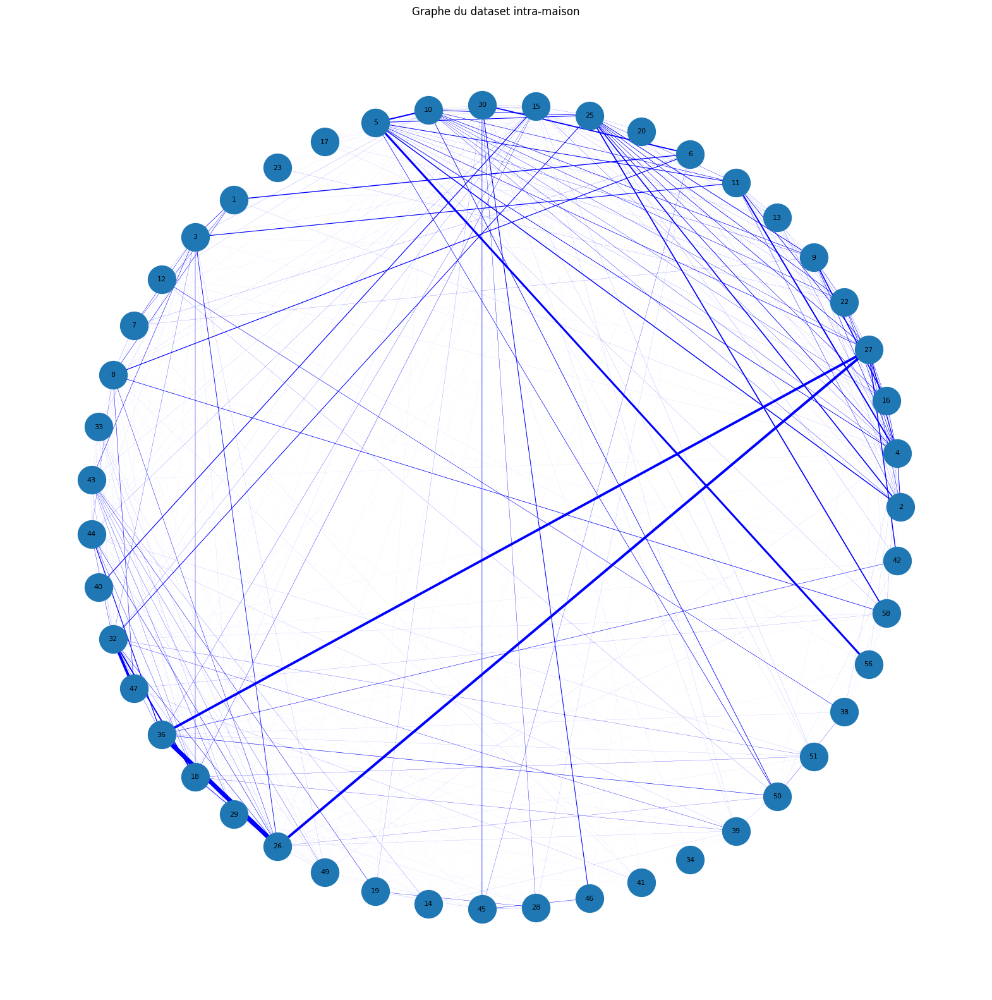

In [5]:
"""
Graphe basique des contacts dataset 1
"""

G = nx.Graph()


for index, row in data_1.iterrows():
    G.add_node(row['ID1_1'])
    G.add_node(row['ID2_1'])
    contact_weight = row['duration_1'] 
    if G.has_edge(row['ID1_1'], row['ID2_1']):
        G[row['ID1_1']][row['ID2_1']]['weight'] += contact_weight
    else:
        G.add_edge(row['ID1_1'], row['ID2_1'], weight=contact_weight)


edge_weights = [G[u][v]['weight'] for u, v in G.edges()]


pos = nx.circular_layout(G)


plt.figure(figsize=(20, 20)) 


nx.draw_networkx_nodes(G, pos, node_size=1000)
node_labels = {node: node for node in G.nodes()} 
nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=8)


edge_widths = [weight / max(edge_weights) * 5 for weight in edge_weights]
nx.draw_networkx_edges(G, pos, width=edge_widths, edge_color='b', edge_cmap=plt.cm.Blues, edge_vmin=min(edge_weights), edge_vmax=max(edge_weights))


plt.axis('off')
plt.title("Graphe du dataset intra-maison")
plt.show()

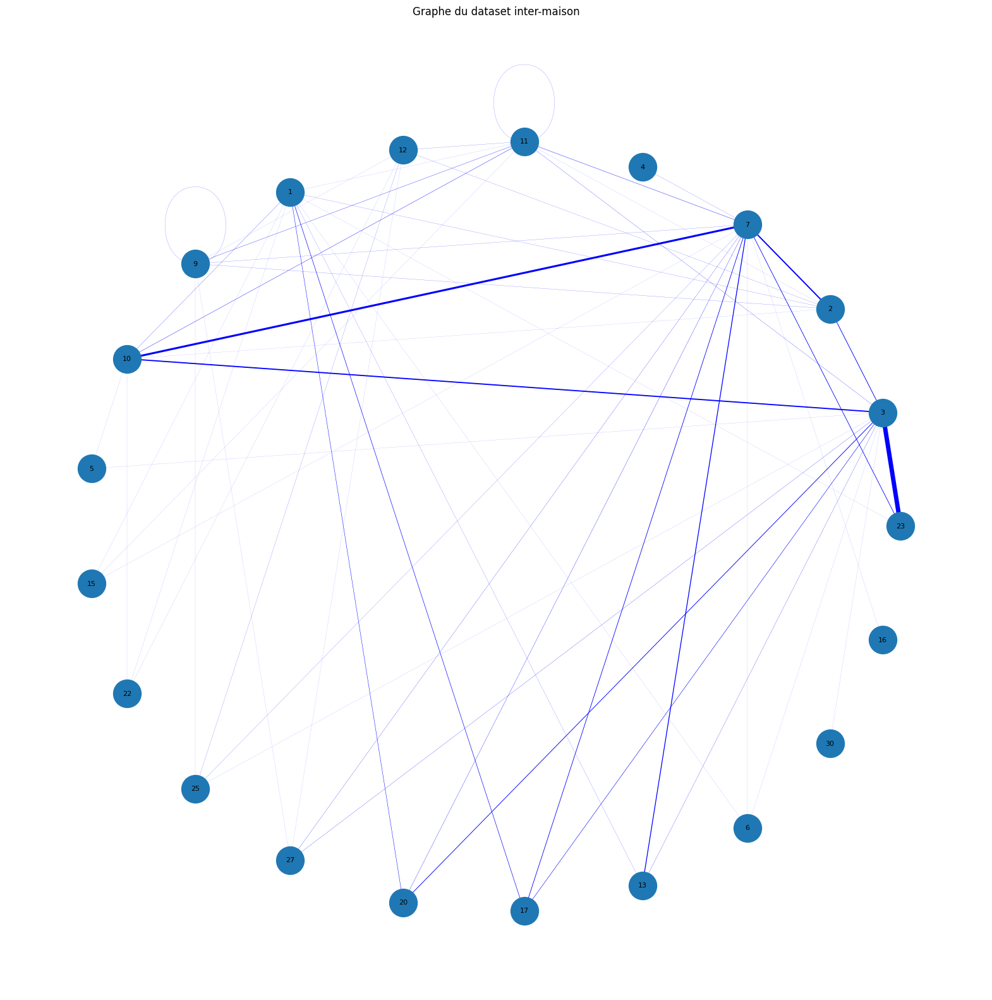

In [6]:
"""
Graphe basique des contacts dataset 2
"""
G = nx.Graph()


for index, row in data_2.iterrows():
    G.add_node(row['ID1_2'])
    G.add_node(row['ID2_2'])
    contact_weight = row['duration_2']
    if G.has_edge(row['ID1_2'], row['ID2_2']):
        G[row['ID1_2']][row['ID2_2']]['weight'] += contact_weight
    else:
        G.add_edge(row['ID1_2'], row['ID2_2'], weight=contact_weight)


edge_weights = [G[u][v]['weight'] for u, v in G.edges()]


pos = nx.circular_layout(G)


plt.figure(figsize=(20, 20))


nx.draw_networkx_nodes(G, pos, node_size=1000)
node_labels = {node: node for node in G.nodes()} 
nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=8)



edge_widths = [weight / max(edge_weights) * 5 for weight in edge_weights]  
nx.draw_networkx_edges(G, pos, width=edge_widths, edge_color='b', edge_cmap=plt.cm.Blues, edge_vmin=min(edge_weights), edge_vmax=max(edge_weights))


plt.axis('off')
plt.title("Graphe du dataset inter-maison")
plt.show()

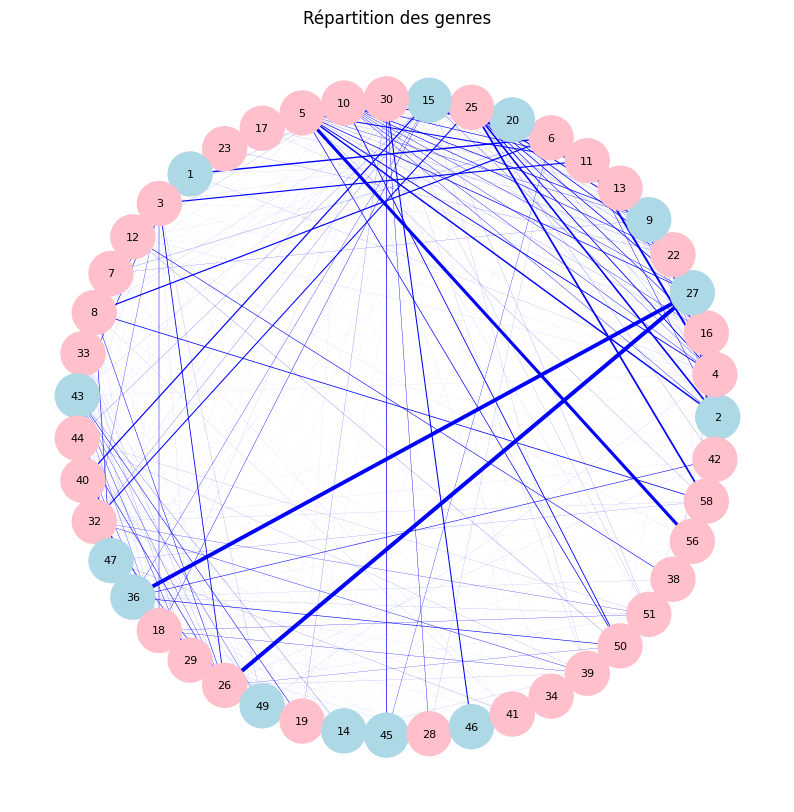

In [7]:
"""
Répartition des genres dataset 1
"""
G = nx.Graph()

for index, row in data_1.iterrows():
    G.add_node(row['ID1_1'], genre=row['genre1_1'])
    G.add_node(row['ID2_1'], genre=row['genre2_1'])
    contact_weight = row['duration_1'] 
    if G.has_edge(row['ID1_1'], row['ID2_1']):
        G[row['ID1_1']][row['ID2_1']]['weight'] += contact_weight
    else:
        G.add_edge(row['ID1_1'], row['ID2_1'], weight=contact_weight)

edge_weights = [G[u][v]['weight'] for u, v in G.edges()]

pos = nx.circular_layout(G)

plt.figure(figsize=(10, 10))

colormap = {'M': 'lightblue', 'F': 'pink'}

color_dict_id1 = {node: colormap[data['genre']] for node, data in G.nodes(data=True) if 'genre' in data}

node_color_list = [color_dict_id1.get(node, 'gray') for node in G.nodes()]
nx.draw_networkx_nodes(G, pos, node_size=1000, node_color=node_color_list)

node_labels = {node: node for node in G.nodes()}
nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=8)

edge_widths = [weight / max(edge_weights) * 5 for weight in edge_weights]
nx.draw_networkx_edges(G, pos, width=edge_widths, edge_color='b', edge_cmap=plt.cm.Blues, edge_vmin=min(edge_weights), edge_vmax=max(edge_weights))

plt.axis('off')
plt.title("Répartition des genres")
plt.show()

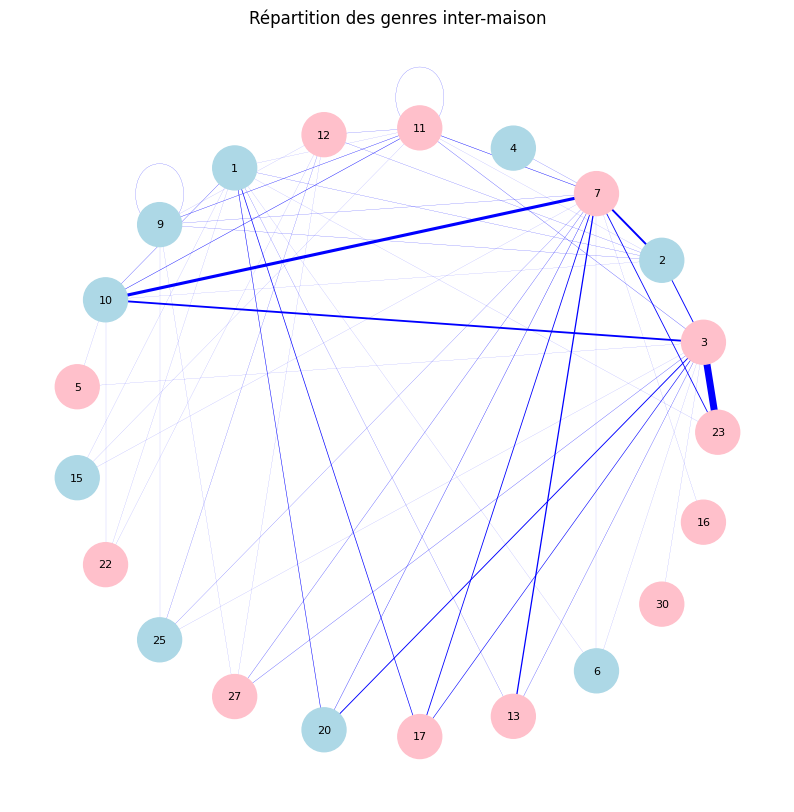

In [8]:
"""
Répartition des genres dataset 2
"""
G = nx.Graph()

for index, row in data_2.iterrows():
    G.add_node(row['ID1_2'], genre=row['genre1_2'])
    G.add_node(row['ID2_2'], genre=row['genre2_2'])
    contact_weight = row['duration_2'] 
    if G.has_edge(row['ID1_2'], row['ID2_2']):
        G[row['ID1_2']][row['ID2_2']]['weight'] += contact_weight
    else:
        G.add_edge(row['ID1_2'], row['ID2_2'], weight=contact_weight)

edge_weights = [G[u][v]['weight'] for u, v in G.edges()]

pos = nx.circular_layout(G)
plt.figure(figsize=(10, 10)) 

colormap = {'M': 'lightblue', 'F': 'pink'}

color_dict_id1 = {node: colormap[data['genre']] for node, data in G.nodes(data=True) if 'genre' in data}

node_color_list = [color_dict_id1.get(node, 'gray') for node in G.nodes()]
nx.draw_networkx_nodes(G, pos, node_size=1000, node_color=node_color_list)

node_labels = {node: node for node in G.nodes()}
nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=8)

edge_widths = [weight / max(edge_weights) * 5 for weight in edge_weights]
nx.draw_networkx_edges(G, pos, width=edge_widths, edge_color='b', edge_cmap=plt.cm.Blues, edge_vmin=min(edge_weights), edge_vmax=max(edge_weights))

plt.axis('off')
plt.title("Répartition des genres inter-maison")
plt.show()

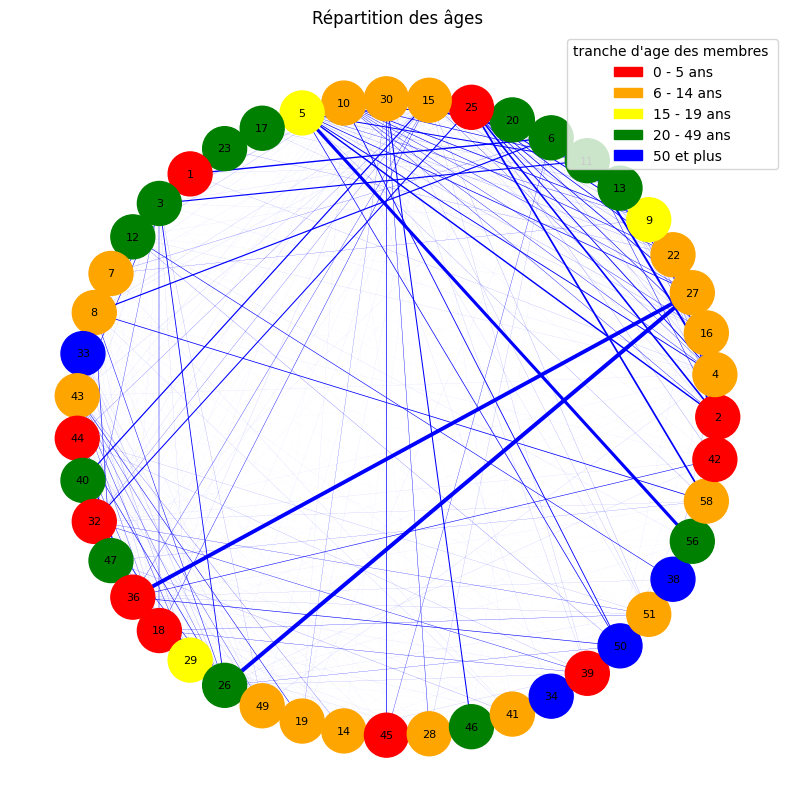

In [9]:
"""
Répartition des age dataset 1
"""
G = nx.Graph()

for index, row in data_1.iterrows():
    G.add_node(row['ID1_1'], age=row['age1_1'])
    G.add_node(row['ID2_1'], age=row['age2_1'])
    contact_weight = row['duration_1'] 
    if G.has_edge(row['ID1_1'], row['ID2_1']):
        G[row['ID1_1']][row['ID2_1']]['weight'] += contact_weight
    else:
        G.add_edge(row['ID1_1'], row['ID2_1'], weight=contact_weight)

edge_weights = [G[u][v]['weight'] for u, v in G.edges()]

pos = nx.circular_layout(G)

plt.figure(figsize=(10, 10))

colormap = {'0': 'red', '1': 'orange', '2': 'yellow', '3': 'green', '4': 'blue'}

color_dict_id1 = {node: colormap[str(data['age'])] for node, data in G.nodes(data=True) if 'age' in data}

legend_labels = {
    '0': '0 - 5 ans',
    '1': '6 - 14 ans',
    '2': '15 - 19 ans',
    '3': '20 - 49 ans',
    '4': '50 et plus'
}

node_color_list = [color_dict_id1.get(node, 'gray') for node in G.nodes()]
nodes = nx.draw_networkx_nodes(G, pos, node_size=1000, node_color=node_color_list)

node_labels = {node: node for node in G.nodes()}
nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=8)

edge_widths = [weight / max(edge_weights) * 5 for weight in edge_weights]
edges = nx.draw_networkx_edges(G, pos, width=edge_widths, edge_color='b', edge_cmap=plt.cm.Blues, edge_vmin=min(edge_weights), edge_vmax=max(edge_weights))

legend_patches = [mpatches.Patch(color=colormap[str(age)], label=label) for age, label in legend_labels.items()]
plt.legend(handles=legend_patches, title="tranche d'age des membres ", loc='upper right')

plt.axis('off')
plt.title("Répartition des âges")
plt.show()


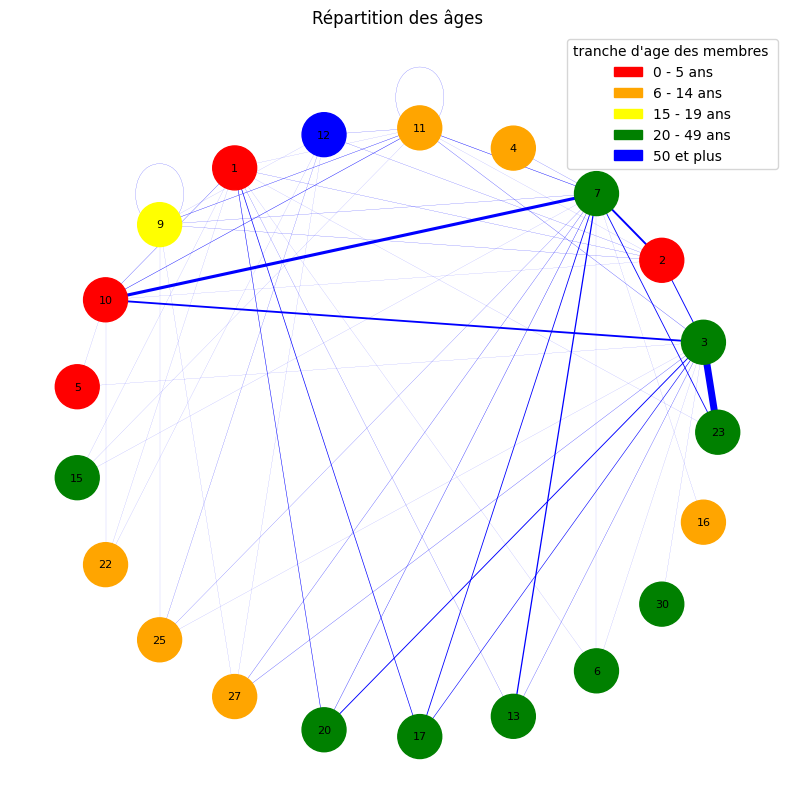

In [10]:
"""
Répartition des age dataset 2
"""
G = nx.Graph()

for index, row in data_2.iterrows():
    G.add_node(row['ID1_2'], age=row['age1_2'])
    G.add_node(row['ID2_2'], age=row['age2_2'])
    contact_weight = row['duration_2']
    if G.has_edge(row['ID1_2'], row['ID2_2']):
        G[row['ID1_2']][row['ID2_2']]['weight'] += contact_weight
    else:
        G.add_edge(row['ID1_2'], row['ID2_2'], weight=contact_weight)

edge_weights = [G[u][v]['weight'] for u, v in G.edges()]

pos = nx.circular_layout(G)
plt.figure(figsize=(10, 10))
colormap = {'0': 'red', '1': 'orange', '2': 'yellow', '3': 'green', '4': 'blue'}
color_dict_id1 = {node: colormap[str(data['age'])] for node, data in G.nodes(data=True) if 'age' in data}


legend_labels = {
    '0': '0 - 5 ans',
    '1': '6 - 14 ans',
    '2': '15 - 19 ans',
    '3': '20 - 49 ans',
    '4': '50 et plus'
}

node_color_list = [color_dict_id1.get(node, 'gray') for node in G.nodes()]
nodes = nx.draw_networkx_nodes(G, pos, node_size=1000, node_color=node_color_list)
node_labels = {node: node for node in G.nodes()}
nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=8)

edge_widths = [weight / max(edge_weights) * 5 for weight in edge_weights]
edges = nx.draw_networkx_edges(G, pos, width=edge_widths, edge_color='b', edge_cmap=plt.cm.Blues, edge_vmin=min(edge_weights), edge_vmax=max(edge_weights))
legend_patches = [mpatches.Patch(color=colormap[str(age)], label=label) for age, label in legend_labels.items()]
plt.legend(handles=legend_patches, title="tranche d'age des membres ", loc='upper right')

plt.axis('off')
plt.title("Répartition des âges")
plt.show()

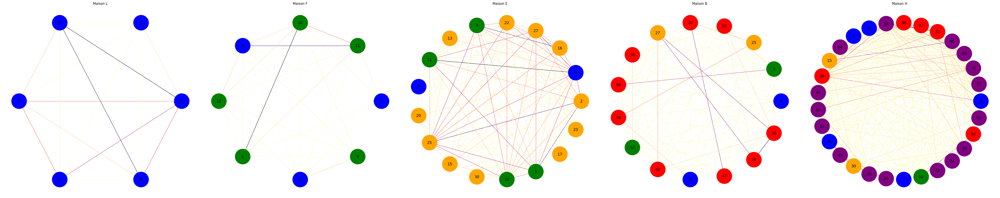

In [11]:
"""
Graphe des différentes maisons dataset 1
"""

desired_order = ['L', 'F', 'E', 'B', 'H']
fig, axes = plt.subplots(1, len(desired_order), figsize=(50, 10))
for ax in axes:
    ax.set_facecolor('gray')
colormap = {'L': 'blue', 'F': 'green', 'E': 'orange', 'B': 'red', 'H': 'purple'}
color_dict_maison1 = {}
color_dict_id1 = {}


for i, maison_value in enumerate(desired_order):
    if maison_value not in color_dict_maison1:
        color_dict_maison1[maison_value] = colormap.get(maison_value, 'gray')

    subgraph_data = data_1[data_1['Maison1_1'] == maison_value]
    
    G = nx.Graph()

    for index, row in subgraph_data.iterrows():
        G.add_node(row['ID1_1'])
        G.add_node(row['ID2_1'])
        contact_weight = row['duration_1']
        if G.has_edge(row['ID1_1'], row['ID2_1']):
            G[row['ID1_1']][row['ID2_1']]['weight'] += contact_weight
        else:
            G.add_edge(row['ID1_1'], row['ID2_1'], weight=contact_weight)

    pos = nx.circular_layout(G)

    for id1_value in G.nodes():
        if id1_value not in color_dict_id1:
            color_dict_id1[id1_value] = color_dict_maison1[maison_value]

    node_colors = [color_dict_id1[id1] for id1 in G.nodes()]
    edge_weights = [G[u][v]['weight'] for u, v in G.edges()]

    nx.draw(G, pos, node_color=node_colors, with_labels=True, node_size=3000, font_size=14, ax=axes[i], edge_color=edge_weights, edge_cmap=plt.cm.magma_r, edge_vmin=min(edge_weights), edge_vmax=max(edge_weights))
    axes[i].set_title(f'Maison {maison_value}')

plt.tight_layout()
plt.show()

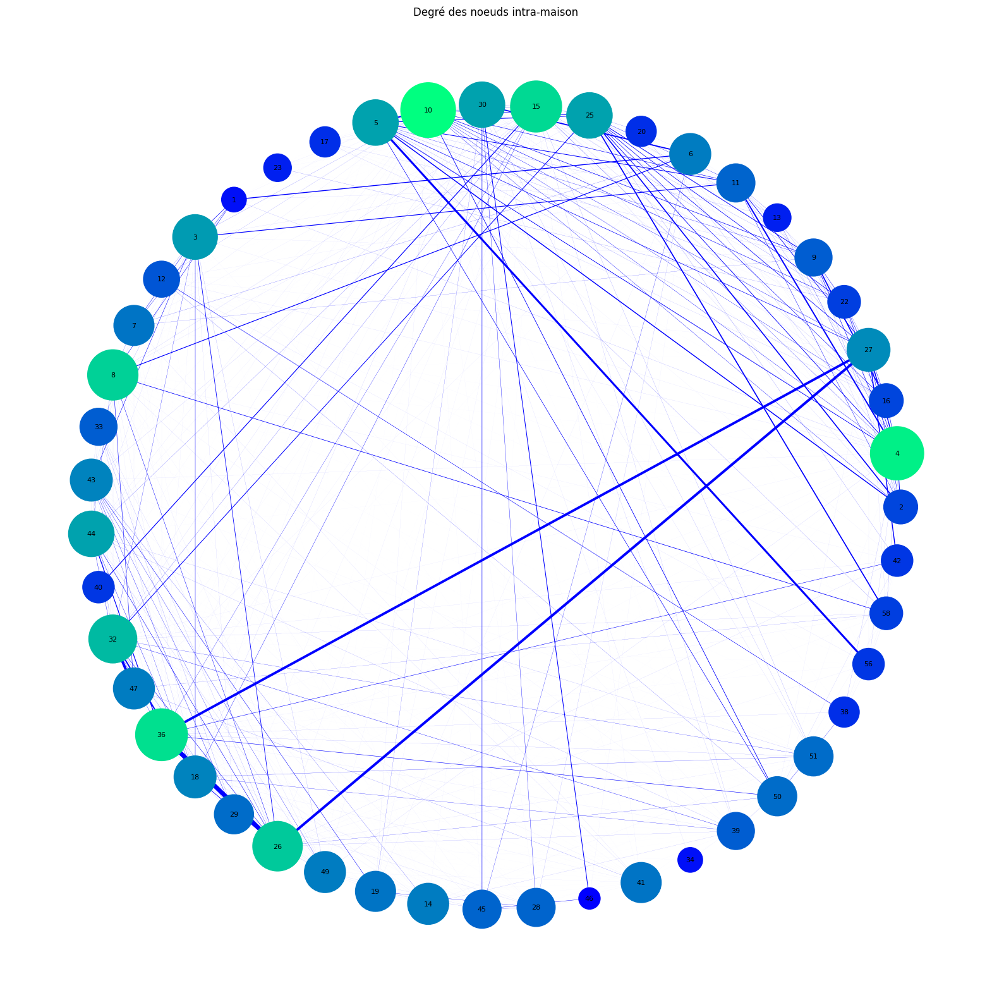

In [12]:
"""
Distribution des degrés dataset 1
"""
G = nx.Graph()

for index, row in data_1.iterrows():
    G.add_node(row['ID1_1'])
    G.add_node(row['ID2_1'])
    contact_weight = row['duration_1']
    if G.has_edge(row['ID1_1'], row['ID2_1']):
        G[row['ID1_1']][row['ID2_1']]['weight'] += contact_weight
    else:
        G.add_edge(row['ID1_1'], row['ID2_1'], weight=contact_weight)

edge_weights = [G[u][v]['weight'] for u, v in G.edges()]
node_degrees = dict(G.degree())
pos = nx.circular_layout(G)

plt.figure(figsize=(20, 20))
node_sizes = [degree * 100 for degree in node_degrees.values()]
nx.draw_networkx_nodes(G, pos, node_size=node_sizes, cmap=plt.cm.winter, node_color=list(node_degrees.values()))

node_labels = {node: node for node in G.nodes()}
nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=8)
edge_widths = [weight / max(edge_weights) * 5 for weight in edge_weights]
nx.draw_networkx_edges(G, pos, width=edge_widths, edge_color='b', edge_cmap=plt.cm.Blues, edge_vmin=min(edge_weights), edge_vmax=max(edge_weights))

plt.axis('off')
plt.title("Degré des noeuds intra-maison")
plt.show()

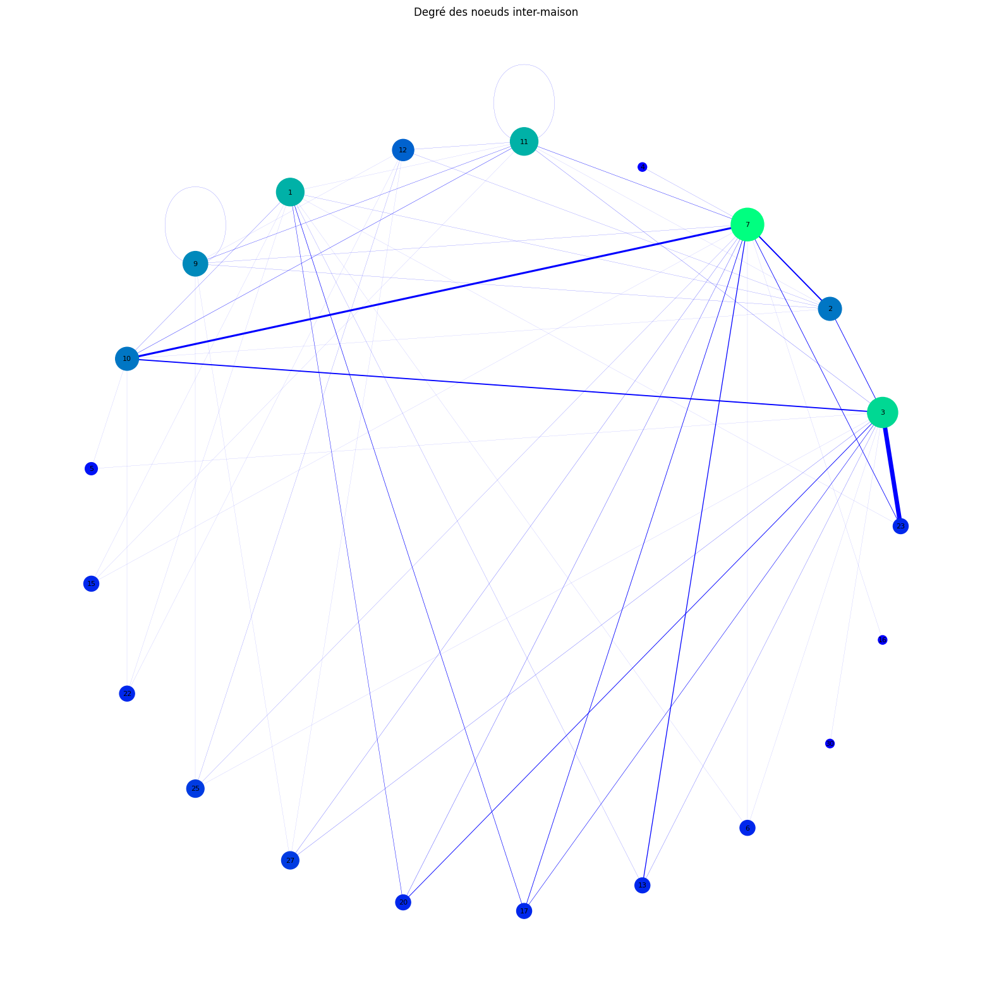

In [13]:
"""
Distribution des degrés dataset 2
"""
G = nx.Graph()

for index, row in data_2.iterrows():
    G.add_node(row['ID1_2'])
    G.add_node(row['ID2_2'])
    contact_weight = row['duration_2']
    if G.has_edge(row['ID1_2'], row['ID2_2']):
        G[row['ID1_2']][row['ID2_2']]['weight'] += contact_weight
    else:
        G.add_edge(row['ID1_2'], row['ID2_2'], weight=contact_weight)

edge_weights = [G[u][v]['weight'] for u, v in G.edges()]
node_degrees = dict(G.degree())
pos = nx.circular_layout(G)


plt.figure(figsize=(20, 20))

node_sizes = [degree * 100 for degree in node_degrees.values()]
nx.draw_networkx_nodes(G, pos, node_size=node_sizes, cmap=plt.cm.winter, node_color=list(node_degrees.values()))
node_labels = {node: node for node in G.nodes()}
nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=8)
edge_widths = [weight / max(edge_weights) * 5 for weight in edge_weights]
nx.draw_networkx_edges(G, pos, width=edge_widths, edge_color='b', edge_cmap=plt.cm.Blues, edge_vmin=min(edge_weights), edge_vmax=max(edge_weights))

plt.axis('off')
plt.title("Degré des noeuds inter-maison")
plt.show()

Mean Proximity Centrality: 0.6504964805319258
Median Proximity Centrality: 0.6388888888888888


C:\Users\bapti\AppData\Local\Temp\ipykernel_25740\1089753770.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('magma')
c:\Python311\Lib\site-packages\networkx\drawing\nx_pylab.py:437: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(


ValueError: Unable to determine Axes to steal space for Colorbar. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.

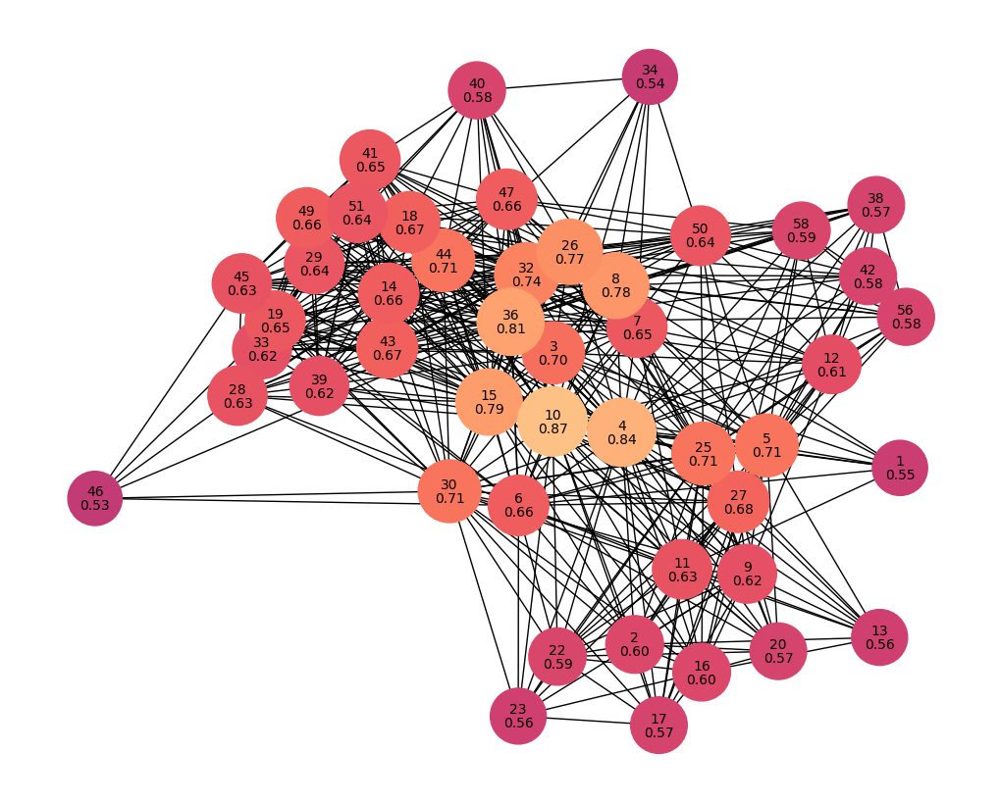

In [14]:
"""
Centralité de proximité dataset 1
"""
G = nx.Graph()

for i, row in data_1.iterrows():
    G.add_node(row['ID1_1'], age=row['age1_1'], genre=row['genre1_1'])
    G.add_node(row['ID2_1'], age=row['age2_1'], genre=row['genre2_1'])

    G.add_edge(row['ID1_1'], row['ID2_1'], duration=row['duration_1'], day=row['day_1'], hour=row['hour_1'])

centrality = nx.algorithms.centrality.closeness_centrality(G)

mean_centrality = sum(centrality.values()) / len(centrality)
median_centrality = statistics.median(centrality.values())
print("Mean Proximity Centrality:", mean_centrality)
print("Median Proximity Centrality:", median_centrality)


node_size = [centrality[node] * 3000 for node in G.nodes]
fig_size = (10, 8)
font_size = 10
cmap = cm.get_cmap('magma')
node_colors = [cmap(centrality[node]) for node in G.nodes]

plt.figure(figsize=fig_size)
pos = nx.spring_layout(G)
nx.draw(G, pos, with_labels=False, node_size=node_size, font_size=font_size, node_color=node_colors, cmap=cmap)

id_labels = {node: str(node) for node in G.nodes}
nx.draw_networkx_labels(G, pos, labels=id_labels, font_size=font_size, verticalalignment='bottom')

centrality_labels = {node: f"{centrality[node]:.2f}" for node in G.nodes}
nx.draw_networkx_labels(G, pos, labels=centrality_labels, font_size=font_size, verticalalignment='top')

sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=min(centrality.values()), vmax=max(centrality.values())))
sm.set_array([])
cbar = plt.colorbar(sm, orientation='vertical', pad=0.05)
cbar.set_label('Taux de proximité')

plt.title('Centralité de proximité intra-maison')
plt.show()

Mean Proximity Centrality: 0.5383311585057012
Median Proximity Centrality: 0.5263157894736842


C:\Users\Administrator\AppData\Local\Temp\ipykernel_2484\1682065716.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('magma')
C:\Users\Administrator\AppData\Local\Temp\ipykernel_2484\1682065716.py:37: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, orientation='vertical', pad=0.05)


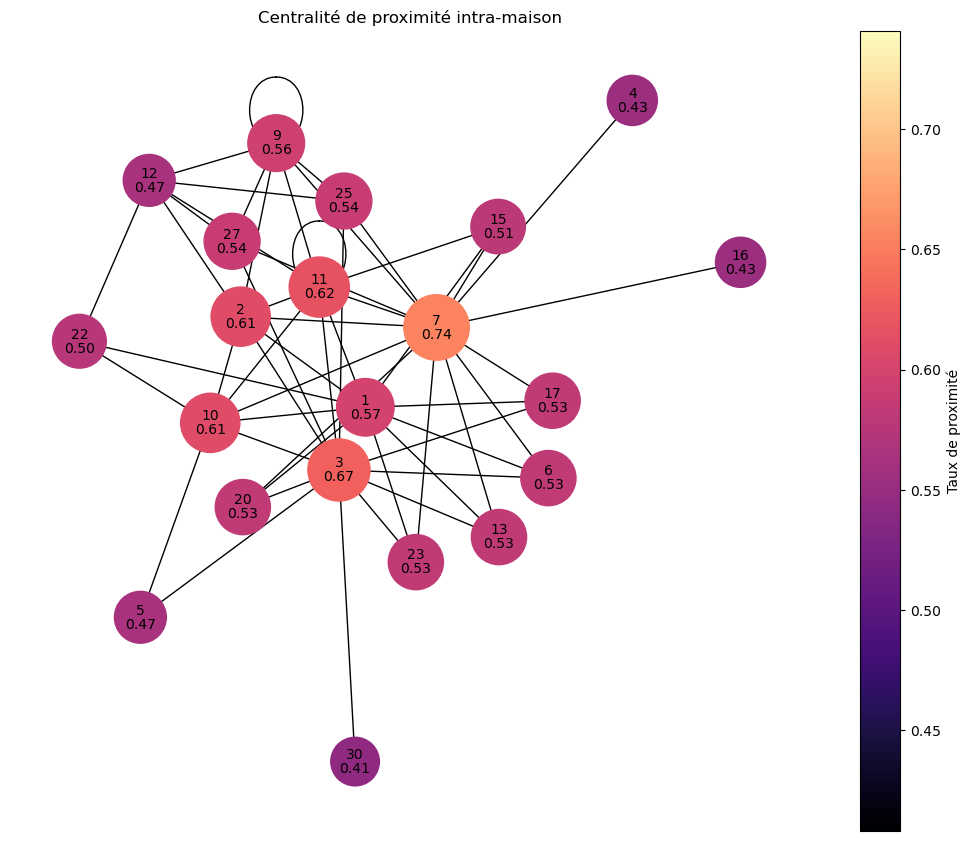

In [ ]:
"""
Centralité de proximité dataset 2
"""
G = nx.Graph()

for i, row in data_2.iterrows():
    G.add_node(row['ID1_2'], age=row['age1_2'], genre=row['genre1_2'])
    G.add_node(row['ID2_2'], age=row['age2_2'], genre=row['genre2_2'])
    G.add_edge(row['ID1_2'], row['ID2_2'], duration=row['duration_2'], day=row['day_2'], hour=row['hour_2'])

centrality = nx.algorithms.centrality.closeness_centrality(G)
mean_centrality = sum(centrality.values()) / len(centrality)
median_centrality = statistics.median(centrality.values())
print("Mean Proximity Centrality:", mean_centrality)
print("Median Proximity Centrality:", median_centrality)


node_size = [centrality[node] * 3000 for node in G.nodes]
fig_size = (10, 8)
font_size = 10
cmap = cm.get_cmap('magma')
node_colors = [cmap(centrality[node]) for node in G.nodes]

plt.figure(figsize=fig_size)
pos = nx.spring_layout(G)
nx.draw(G, pos, with_labels=False, node_size=node_size, font_size=font_size, node_color=node_colors, cmap=cmap)

id_labels = {node: str(node) for node in G.nodes}
nx.draw_networkx_labels(G, pos, labels=id_labels, font_size=font_size, verticalalignment='bottom')

centrality_labels = {node: f"{centrality[node]:.2f}" for node in G.nodes}
nx.draw_networkx_labels(G, pos, labels=centrality_labels, font_size=font_size, verticalalignment='top')


sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=min(centrality.values()), vmax=max(centrality.values())))
sm.set_array([])
cbar = plt.colorbar(sm, orientation='vertical', pad=0.05)
cbar.set_label('Taux de proximité')

plt.title('Centralité de proximité intra-maison')
plt.show()

C:\Users\Administrator\AppData\Local\Temp\ipykernel_2484\561292410.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('plasma')
C:\Users\Administrator\AppData\Local\Temp\ipykernel_2484\561292410.py:34: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, orientation='vertical', pad=0.05)


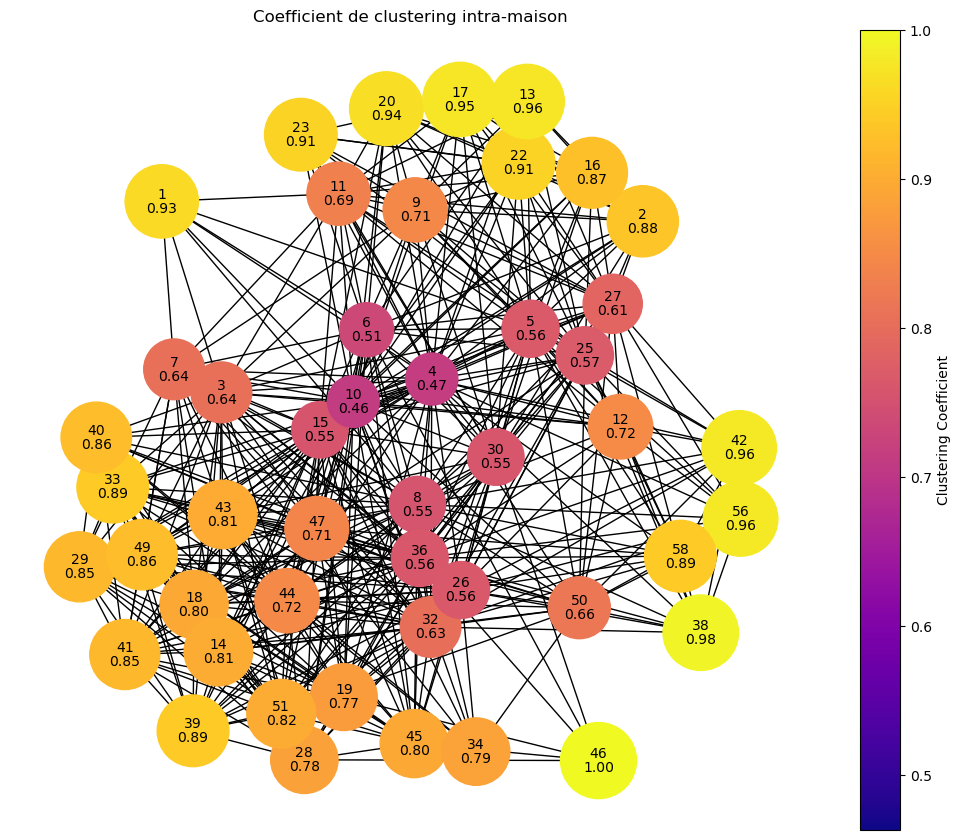

In [ ]:
"""
Coefficient de clustering dataset 1
"""
G = nx.Graph()

for i, row in data_1.iterrows():
    G.add_node(row['ID1_1'], age=row['age1_1'], genre=row['genre1_1'])
    G.add_node(row['ID2_1'], age=row['age2_1'], genre=row['genre2_1'])

    G.add_edge(row['ID1_1'], row['ID2_1'], duration=row['duration_1'], day=row['day_1'], hour=row['hour_1'])

clustering_coefficients = nx.clustering(G)

node_size = [clustering_coefficients[node] * 3000 for node in G.nodes]
fig_size = (10, 8)
font_size = 10


cmap = cm.get_cmap('plasma')
node_colors = [cmap(clustering_coefficients[node]) for node in G.nodes]

plt.figure(figsize=fig_size)
pos = nx.kamada_kawai_layout(G)
nx.draw(G, pos, with_labels=False, node_size=node_size, font_size=font_size, node_color=node_colors, cmap=cmap)

id_labels = {node: str(node) for node in G.nodes}
nx.draw_networkx_labels(G, pos, labels=id_labels, font_size=font_size, verticalalignment='bottom')

coeff_labels = {node: f"{clustering_coefficients[node]:.2f}" for node in G.nodes}
nx.draw_networkx_labels(G, pos, labels=coeff_labels, font_size=font_size, verticalalignment='top')

sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=min(clustering_coefficients.values()), vmax=max(clustering_coefficients.values())))
sm.set_array([])
cbar = plt.colorbar(sm, orientation='vertical', pad=0.05)
cbar.set_label('Clustering Coefficient')

plt.title('Coefficient de clustering intra-maison')
plt.show()

C:\Users\Administrator\AppData\Local\Temp\ipykernel_2484\2360883278.py:16: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('plasma')
C:\Users\Administrator\AppData\Local\Temp\ipykernel_2484\2360883278.py:31: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, orientation='vertical', pad=0.05)


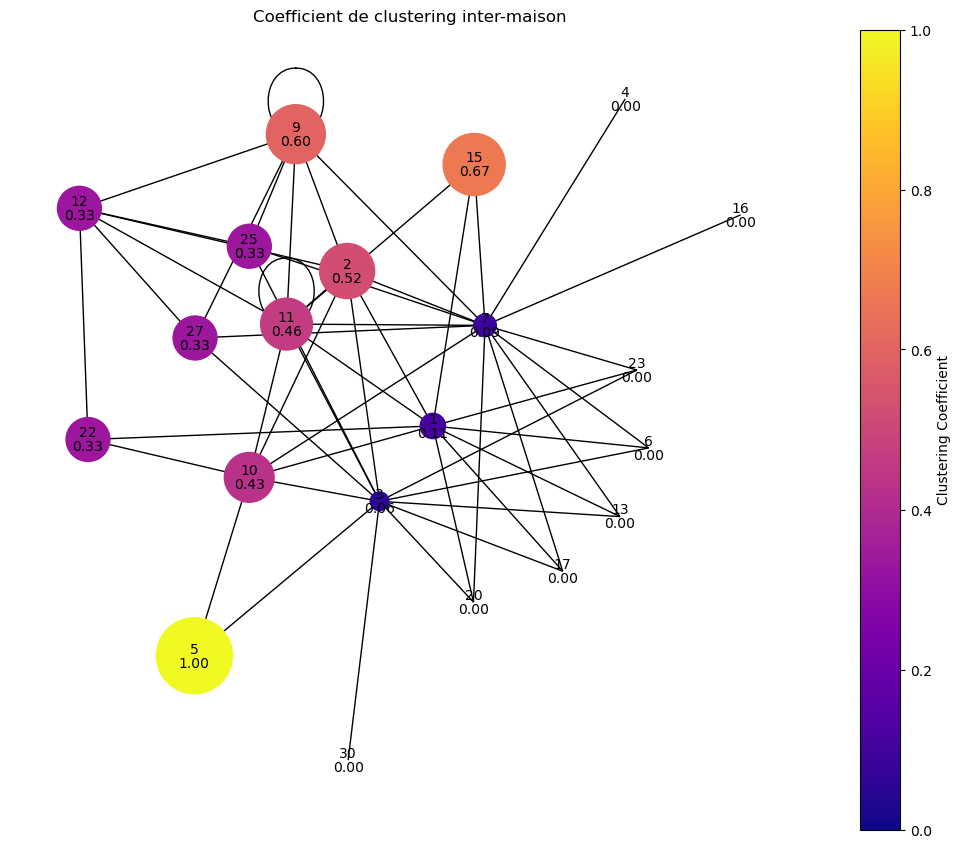

In [ ]:
"""
Coefficient de clustering dataset 2
"""
G = nx.Graph()

for i, row in data_2.iterrows():
    G.add_node(row['ID1_2'], age=row['age1_2'], genre=row['genre1_2'])
    G.add_node(row['ID2_2'], age=row['age2_2'], genre=row['genre2_2'])
    G.add_edge(row['ID1_2'], row['ID2_2'], duration=row['duration_2'], day=row['day_2'], hour=row['hour_2'])

clustering_coefficients = nx.clustering(G)

node_size = [clustering_coefficients[node] * 3000 for node in G.nodes]
fig_size = (10, 8)
font_size = 10
cmap = cm.get_cmap('plasma')
node_colors = [cmap(clustering_coefficients[node]) for node in G.nodes]


plt.figure(figsize=fig_size)
pos = nx.kamada_kawai_layout(G)
nx.draw(G, pos, with_labels=False, node_size=node_size, font_size=font_size, node_color=node_colors, cmap=cmap)
id_labels = {node: str(node) for node in G.nodes}
nx.draw_networkx_labels(G, pos, labels=id_labels, font_size=font_size, verticalalignment='bottom')

coeff_labels = {node: f"{clustering_coefficients[node]:.2f}" for node in G.nodes}
nx.draw_networkx_labels(G, pos, labels=coeff_labels, font_size=font_size, verticalalignment='top')

sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=min(clustering_coefficients.values()), vmax=max(clustering_coefficients.values())))
sm.set_array([])
cbar = plt.colorbar(sm, orientation='vertical', pad=0.05)
cbar.set_label('Clustering Coefficient')

plt.title('Coefficient de clustering inter-maison')
plt.show()

In [ ]:
# Les différents membres de chaque maisons.
household_counts = data_2.groupby('Maison1_2')['ID1_2'].nunique().reset_index(name='MemberCount')
print(household_counts)

  Maison1_2  MemberCount
0         E           11
1         F            3
2         L            3


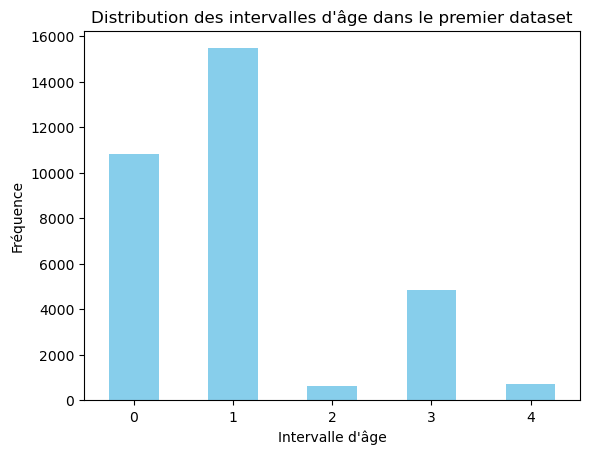

In [ ]:

age_intervals = data_1['age1_1']
age_interval_counts = age_intervals.value_counts()
age_interval_counts = age_interval_counts.sort_index()
age_interval_counts.plot(kind='bar', color='skyblue')
plt.title("Distribution des intervalles d'âge dans le premier dataset")
plt.xlabel("Intervalle d'âge")
plt.ylabel("Fréquence")
plt.xticks(rotation=0)
plt.show()

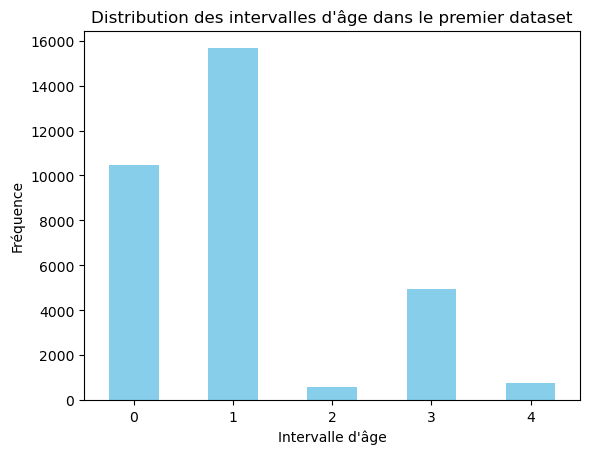

In [ ]:

age_intervals = data_1['age2_1']
age_interval_counts = age_intervals.value_counts()
age_interval_counts = age_interval_counts.sort_index()
age_interval_counts.plot(kind='bar', color='skyblue')
plt.title("Distribution des intervalles d'âge dans le premier dataset")
plt.xlabel("Intervalle d'âge")
plt.ylabel("Fréquence")
plt.xticks(rotation=0)
plt.show()

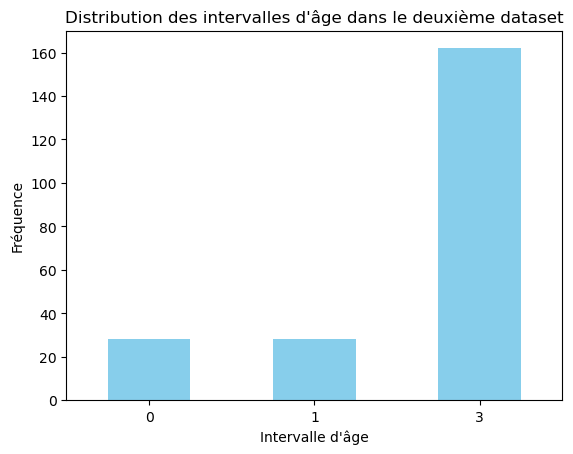

In [ ]:

age_intervals = data_2['age1_2']
age_interval_counts = age_intervals.value_counts()
age_interval_counts = age_interval_counts.sort_index()

age_interval_counts.plot(kind='bar', color='skyblue')
plt.title("Distribution des intervalles d'âge dans le deuxième dataset")
plt.xlabel("Intervalle d'âge")
plt.ylabel("Fréquence")
plt.xticks(rotation=0)
plt.show()

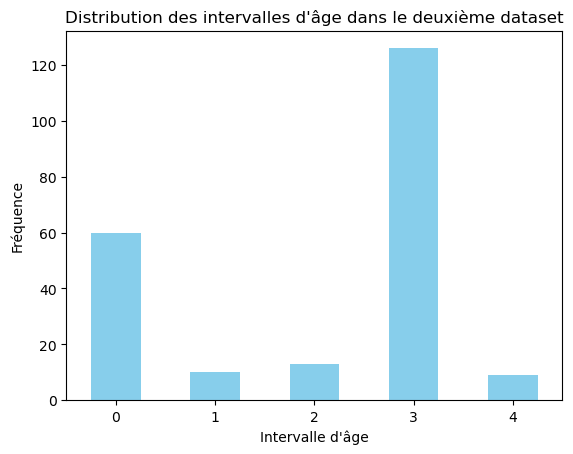

In [ ]:

age_intervals = data_2['age2_2']
age_interval_counts = age_intervals.value_counts()
age_interval_counts = age_interval_counts.sort_index()
age_interval_counts.plot(kind='bar', color='skyblue')
plt.title("Distribution des intervalles d'âge dans le deuxième dataset")
plt.xlabel("Intervalle d'âge")
plt.ylabel("Fréquence")
plt.xticks(rotation=0)
plt.show()

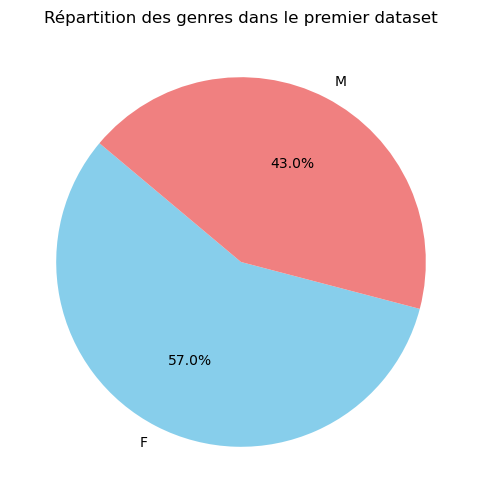

In [ ]:

gender_counts = data_1['genre1_1'].value_counts()
plt.figure(figsize=(6, 6))
plt.pie(gender_counts, labels=gender_counts.index, autopct='%1.1f%%', startangle=140, colors=['skyblue', 'lightcoral'])
plt.title("Répartition des genres dans le premier dataset")
plt.show()

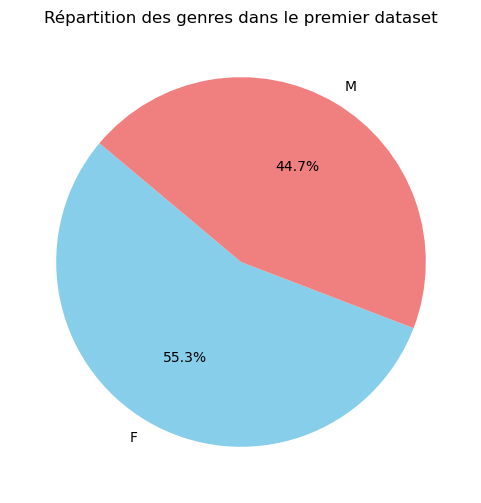

In [ ]:

gender_counts = data_1['genre2_1'].value_counts()

plt.figure(figsize=(6, 6))
plt.pie(gender_counts, labels=gender_counts.index, autopct='%1.1f%%', startangle=140, colors=['skyblue', 'lightcoral'])
plt.title("Répartition des genres dans le premier dataset")
plt.show()

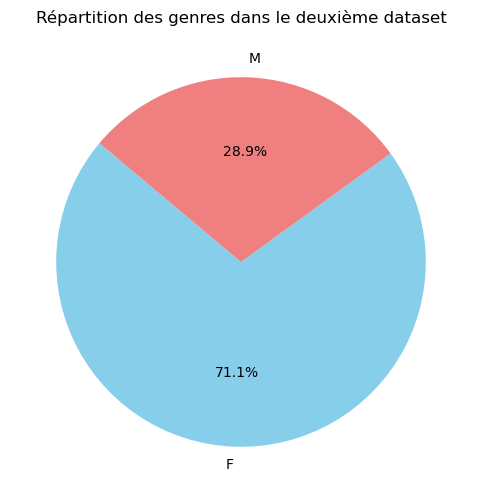

In [ ]:

gender_counts = data_2['genre1_2'].value_counts()

plt.figure(figsize=(6, 6))
plt.pie(gender_counts, labels=gender_counts.index, autopct='%1.1f%%', startangle=140, colors=['skyblue', 'lightcoral'])
plt.title("Répartition des genres dans le deuxième dataset")
plt.show()

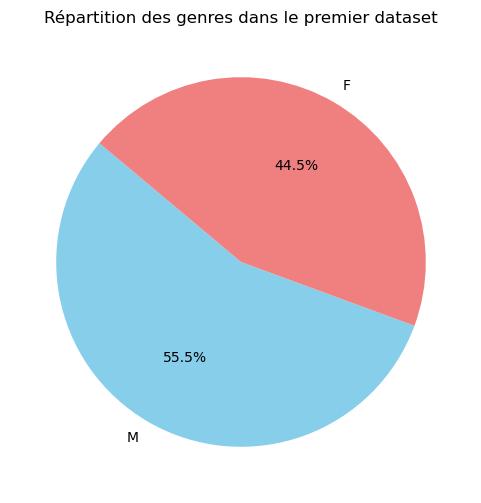

In [ ]:

gender_counts = data_2['genre2_2'].value_counts()

plt.figure(figsize=(6, 6))
plt.pie(gender_counts, labels=gender_counts.index, autopct='%1.1f%%', startangle=140, colors=['skyblue', 'lightcoral'])
plt.title("Répartition des genres dans le premier dataset")
plt.show()

C:\Users\Administrator\AppData\Local\Temp\ipykernel_2484\2707077909.py:23: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm, label="Densité de contact")


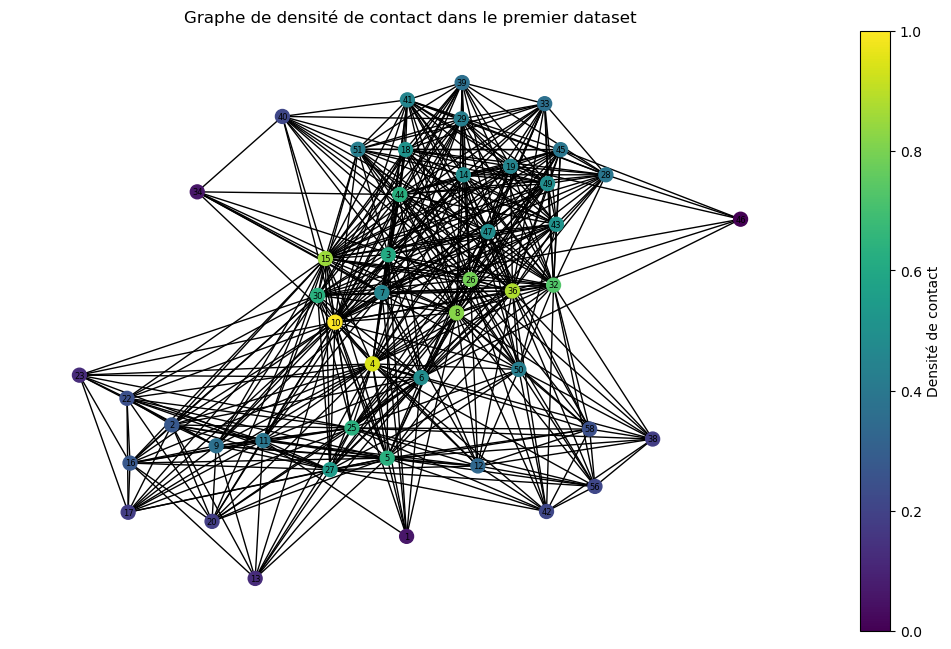

In [ ]:
"""
graphe de densité dataset 1
"""
G = nx.Graph()

G.add_nodes_from(data_1['ID1_1'])
G.add_nodes_from(data_1['ID2_1'])
G.add_edges_from(data_1[['ID1_1', 'ID2_1']].values)

contact_density = dict(G.degree())
average_density = np.mean(list(contact_density.values()))

plt.figure(figsize=(10, 6))
pos = nx.spring_layout(G, seed=42)

node_colors = [contact_density[n] for n in G.nodes()]
cmap = plt.get_cmap('viridis')

nx.draw(G, pos, with_labels=True, node_size=100, node_color=node_colors, cmap=cmap, font_size=6)

sm = plt.cm.ScalarMappable(cmap=cmap)
sm.set_array([])
plt.colorbar(sm, label="Densité de contact")

plt.title("Graphe de densité de contact dans le premier dataset")
plt.show()

c:\ProgramData\anaconda3\Lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(
C:\Users\Administrator\AppData\Local\Temp\ipykernel_2484\4032584390.py:15: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(plt.cm.ScalarMappable(cmap=plt.cm.viridis, norm=plt.Normalize(vmin=0, vmax=max(betweenness_centrality.values()))))


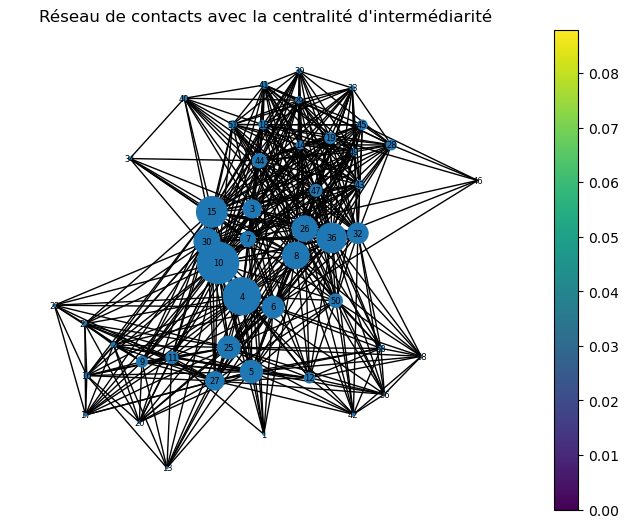

In [ ]:
"""
graphe de densité dataset 2
"""
G = nx.Graph()
G.add_nodes_from(data_1['ID1_1'])
G.add_nodes_from(data_1['ID2_1'])
G.add_edges_from(data_1[['ID1_1', 'ID2_1']].values)

betweenness_centrality = nx.betweenness_centrality(G)

node_size = [10000 * betweenness_centrality[node] for node in G.nodes]
pos = nx.spring_layout(G, seed=42)
nx.draw(G, pos, with_labels=True, node_size=node_size, font_size=6, cmap=plt.cm.viridis)
plt.title("Réseau de contacts avec la centralité d'intermédiarité")
plt.colorbar(plt.cm.ScalarMappable(cmap=plt.cm.viridis, norm=plt.Normalize(vmin=0, vmax=max(betweenness_centrality.values()))))
plt.show()

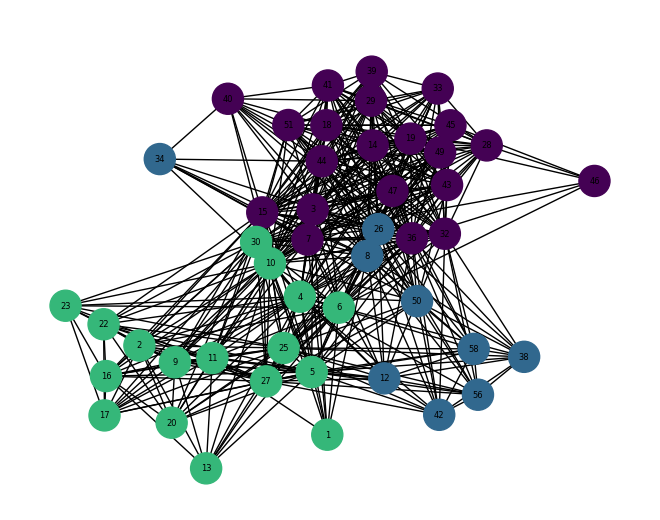

In [ ]:
# Créer un graph à partir du premier dataset
G = nx.Graph()

# Ajouter des nœuds en tant que personnes des colonnes 'ID1_1' et 'ID2_1'
G.add_nodes_from(data_1['ID1_1'])
G.add_nodes_from(data_1['ID2_1'])

# Ajouter des arêtes (liens) entre les personnes en utilisant 'ID1_1' et 'ID2_1'
G.add_edges_from(data_1[['ID1_1', 'ID2_1']].values)

# Détection de communautés
partition = cl.best_partition(G)

# Dessiner le graph en fonction des communautés
pos = nx.spring_layout(G, seed=42)  # Dispose les nœuds pour une meilleure visualisation
cmap = plt.get_cmap("viridis")
size = len(set(partition.values()))
colors = [cmap(i / size) for i in range(size)]
color_map = [colors[partition[node]] for node in G.nodes]
nx.draw(G, pos, with_labels=True, node_color=color_map, node_size=500, font_size=6)
plt.title(" ")
plt.show()

C:\Users\Administrator\AppData\Local\Temp\ipykernel_2484\3039771952.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('viridis', max(node_colors) + 1)


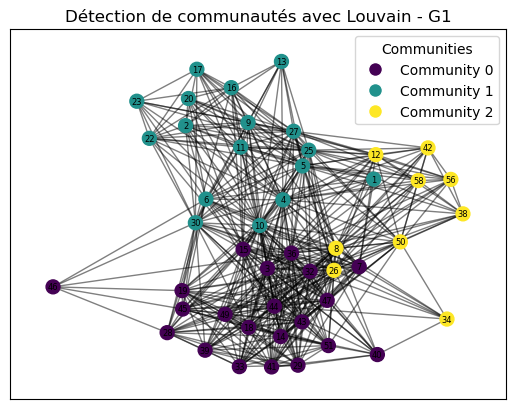

C:\Users\Administrator\AppData\Local\Temp\ipykernel_2484\3039771952.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('viridis', max(node_colors) + 1)


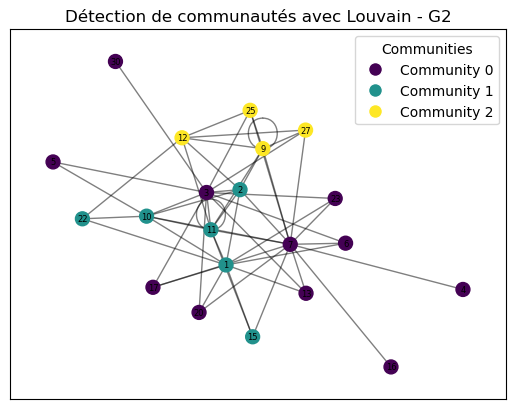

In [ ]:
"""
détection de communauté louvain algo 
"""
def louvain_graph(G, graph_name):
    partition = cl.best_partition(G)
    pos = nx.spring_layout(G)
    node_colors = [partition[node] for node in G.nodes()]
    cmap = plt.cm.get_cmap('viridis', max(node_colors) + 1)
    nodes = nx.draw_networkx_nodes(G, pos, node_size=100, node_color=node_colors, cmap=cmap)
    edges = nx.draw_networkx_edges(G, pos, alpha=0.5)

    labels = {node: str(node) for node in G.nodes()}
    nx.draw_networkx_labels(G, pos, labels=labels, font_size=6)

    handles = []
    for community_id in set(partition.values()):
        handles.append(plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=cmap(community_id), markersize=10, label=f"Community {community_id}"))
    
    plt.legend(handles=handles, title="Communities", loc="upper right")
    plt.title(f"Détection de communautés avec Louvain - {graph_name}")
    plt.show()

G1 = nx.Graph()
G1.add_nodes_from(data_1['ID1_1'])
G1.add_nodes_from(data_1['ID2_1'])
G1.add_edges_from(data_1[['ID1_1', 'ID2_1']].values)
louvain_graph(G1, "G1")

G2 = nx.Graph()
G2.add_nodes_from(data_2['ID1_2'])
G2.add_nodes_from(data_2['ID2_2'])
G2.add_edges_from(data_2[['ID1_2', 'ID2_2']].values)
louvain_graph(G2, "G2")

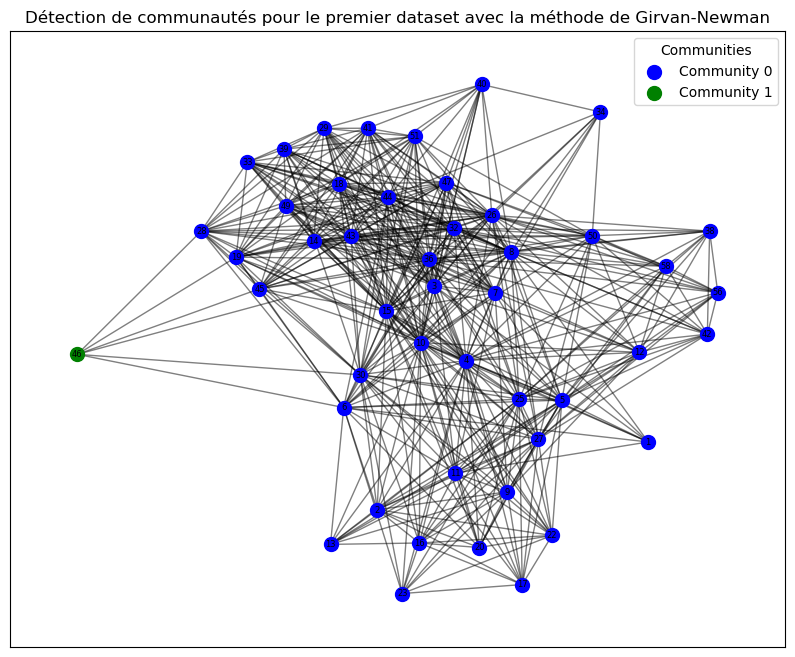

In [ ]:
"""
détection de communauté girvan newman algo 
"""
from networkx.algorithms.community import girvan_newman
import itertools

communities = next(girvan_newman(G1))
colors = itertools.cycle("bgrcmyk")

plt.figure(figsize=(10, 8))
pos = nx.spring_layout(G1)
for i, community in enumerate(communities):
    nx.draw_networkx_nodes(G1, pos, nodelist=community, node_size=100, node_color=next(colors), label=f"Community {i}")
    labels = {node: str(node) for node in community}
    nx.draw_networkx_labels(G1, pos, labels=labels, font_size=6)
nx.draw_networkx_edges(G1, pos, alpha=0.5)

plt.legend(title="Communities", loc="upper right")
plt.title("Détection de communautés pour le premier dataset avec la méthode de Girvan-Newman")
plt.show()

In [ ]:
"""
détection de communauté demon algo 
"""
from cdlib import algorithms
import networkx as nx
import matplotlib.pyplot as plt

G1 = nx.Graph()
G1.add_nodes_from(data_1['ID1_1'])
G1.add_nodes_from(data_1['ID2_1'])
G1.add_edges_from(data_1[['ID1_1', 'ID2_1']].values)

epsilon = 0.1
communities_demon_1 = algorithms.demon(G1, epsilon=epsilon)

plt.figure(figsize=(10, 8))
pos_1 = nx.spring_layout(G1)
colors = plt.cm.viridis.colors
node_colors = [colors[community_id % len(colors)] for community_id, community in enumerate(communities_demon_1.communities) for _ in community]

nx.draw(G1, pos_1, with_labels=True, font_size=6, node_color=node_colors, cmap=plt.cm.viridis)

handles = []
for community_id, nodes in enumerate(communities_demon_1.communities):
    handles.append(plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=colors[community_id % len(colors)], markersize=10, label=f"Community {community_id}"))

plt.legend(handles=handles, title="Communities", loc="upper right")

plt.title("Détection de communautés avec Demon Algorithm - Dataset 1")
plt.show()

ModuleNotFoundError: No module named 'cdlib'

C:\Users\Administrator\AppData\Local\Temp\ipykernel_2484\3642973041.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('Set3', max(node_colors) + 1)


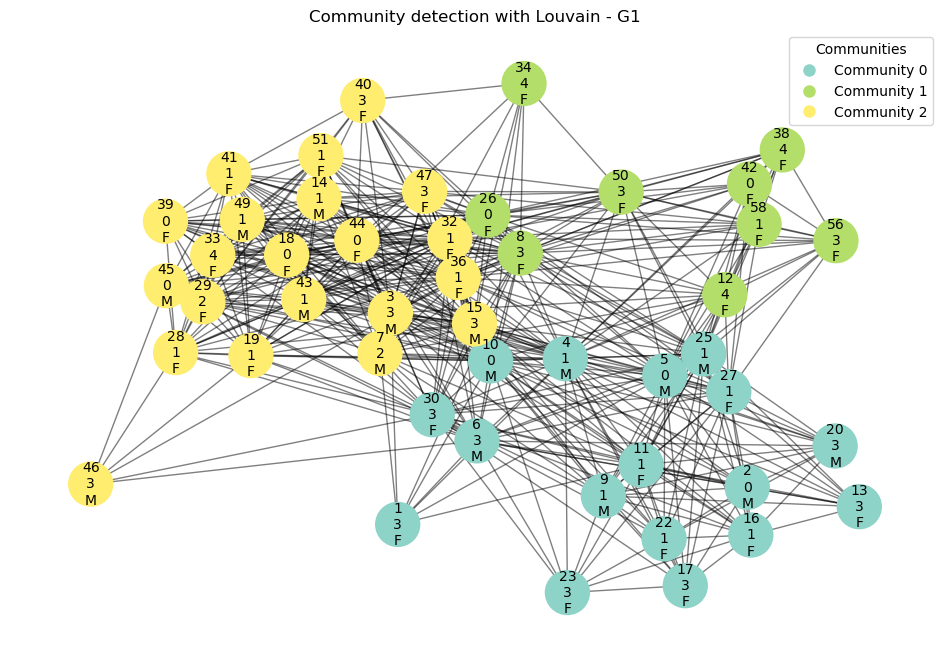

In [ ]:
"""
détection de communauté plus commplet louvain algo
"""
def louvain_graph(G, graph_name):
    partition = cl.best_partition(G)

    pos = nx.spring_layout(G)
    node_colors = [partition[node] for node in G.nodes()]
    cmap = plt.cm.get_cmap('Set3', max(node_colors) + 1)
    
    plt.figure(figsize=(12, 8))
    
    plt.gca().invert_yaxis()
    
    nodes = nx.draw_networkx_nodes(G, pos, node_size=1000, node_color=node_colors, cmap=cmap)
    edges = nx.draw_networkx_edges(G, pos, alpha=0.5)
    labels = {node: f"{node}\n{G.nodes[node].get('age', '')}\n{G.nodes[node].get('genre', '')}" for node in G.nodes()}
    nx.draw_networkx_labels(G, pos, labels=labels, font_size=10, font_color='black')

    handles = []
    for community_id in set(partition.values()):
        handles.append(plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=cmap(community_id), markersize=10, label=f"Community {community_id}"))
    
    plt.legend(handles=handles, title="Communities", loc="upper right")
    plt.title(f"Community detection with Louvain - {graph_name}")
    plt.axis('off')
    plt.show()


for node in G1.nodes():
    matching_rows = data_1[data_1['ID1_1'] == node]
    
    if not matching_rows.empty:
        G1.nodes[node]['age'] = matching_rows['age1_1'].values[0]
        G1.nodes[node]['genre'] = matching_rows['genre1_1'].values[0]

louvain_graph(G1, "G1")

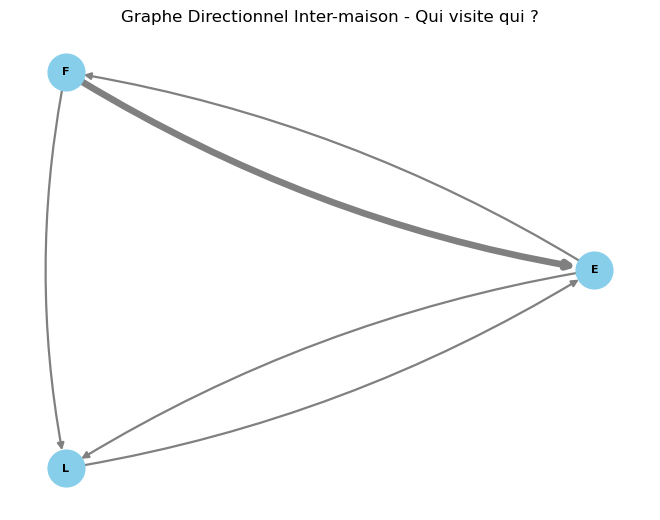

In [ ]:
"""
graphe directionnel maisons dataset 2
"""
G = nx.DiGraph()
for row in data_2.itertuples(index=False):
    maison1_1 = row.Maison1_2
    maison2_2 = row.Maison2_2
    duration = row.duration_2
    G.add_node(maison1_1)
    G.add_edge(maison1_1, maison2_2, weight=duration, label='outgoing')

scaling_factor = 0.08
pos = nx.circular_layout(G)
nx.draw(G, pos, with_labels=True, font_weight='bold', node_size=700, node_color='skyblue', font_size=8, font_color='black', edge_color='gray', width=[scaling_factor * G[edge[0]][edge[1]]['weight'] for edge in G.edges], arrows=True, connectionstyle="arc3,rad=0.1", arrowsize=10)

plt.title('Graphe Directionnel Inter-maison - Qui visite qui ?')
plt.show()

In [ ]:
"""
Comparaisons dataset 1 et 2
Distribution de degré
Coefficient Clusteing
Centralité d'intérmédiarité
"""

from scipy.stats import ks_2samp

def compare_degree_distributions(G1, G2):
    degrees1 = [G1.degree(n) for n in G1.nodes()]
    degrees2 = [G2.degree(n) for n in G2.nodes()]
    
    ks_stat, ks_p_value = ks_2samp(degrees1, degrees2)
    
    plt.figure(figsize=(12, 5))
    plt.hist(degrees1, bins=30, alpha=0.5, label='Graphe Intra-maison')
    plt.hist(degrees2, bins=30, alpha=0.5, label='Graphe Inter-maison')
    plt.title("Comparaison de la distribution de degré")
    plt.xlabel("Degré")
    plt.ylabel("Fréquence")
    plt.legend()
    plt.show()
    
    return ks_stat, ks_p_value

def compare_clustering_coefficients(G1, G2):
    clustering1 = list(nx.clustering(G1).values())
    clustering2 = list(nx.clustering(G2).values())
    
    ks_stat, ks_p_value = ks_2samp(clustering1, clustering2)

    plt.figure(figsize=(12, 5))
    plt.hist(clustering1, bins=30, alpha=0.5, label='Graphe Intra-maison')
    plt.hist(clustering2, bins=30, alpha=0.5, label='Graphe Inter-maison')
    plt.title("Clustering Coefficient Distribution Comparison")
    plt.xlabel("Clustering Coefficient")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()
    
    return ks_stat, ks_p_value

def compare_centrality_distributions(G1, G2, centrality_measure=nx.betweenness_centrality):
    centrality1 = list(centrality_measure(G1).values())
    centrality2 = list(centrality_measure(G2).values())
    
    ks_stat, ks_p_value = ks_2samp(centrality1, centrality2)
    
    plt.figure(figsize=(12, 5))
    plt.hist(centrality1, bins=30, alpha=0.5, label='Graphe Intra-maison')
    plt.hist(centrality2, bins=30, alpha=0.5, label='Graphe Inter-maison')
    plt.title(f"{centrality_measure.__name__.capitalize()} Centrality Distribution Comparison")
    plt.xlabel("Centrality")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()
    
    return ks_stat, ks_p_value

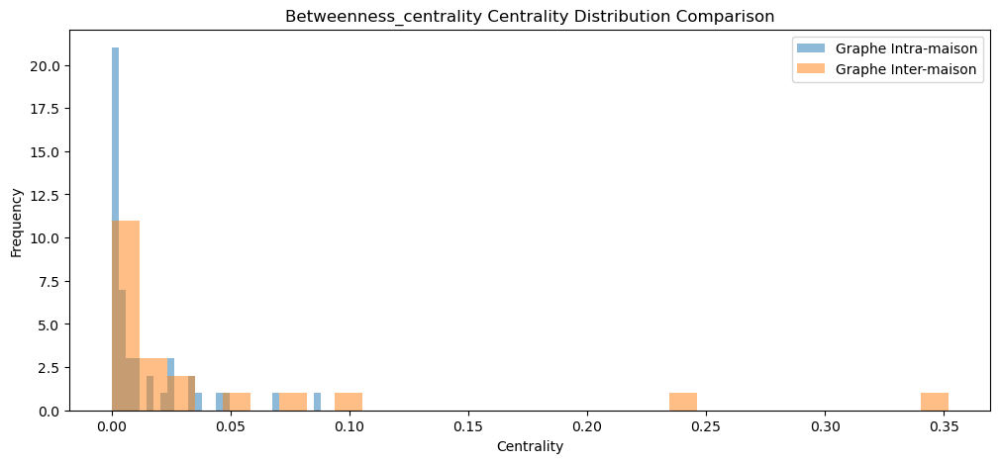

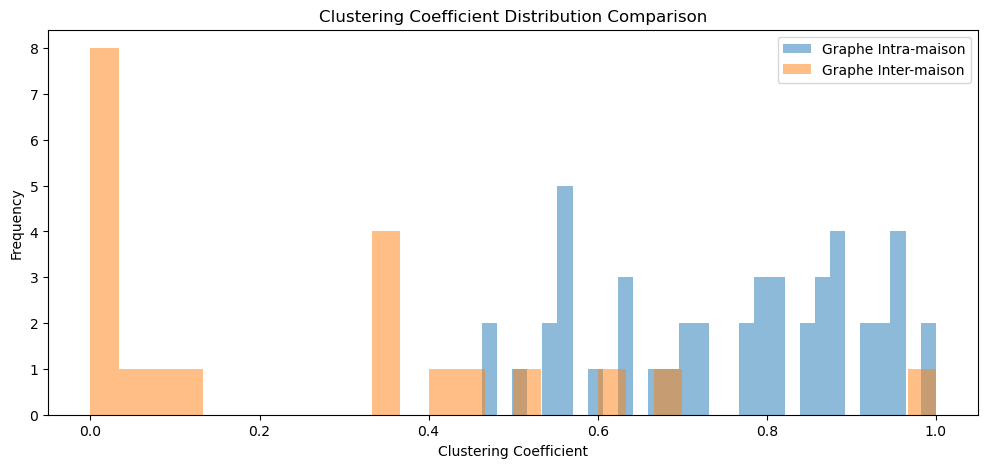

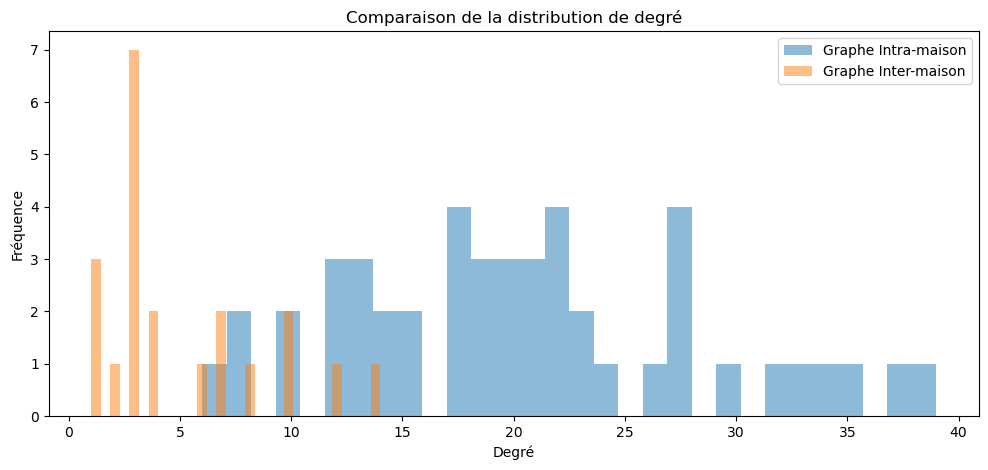

(0.7983789260385005, 9.106084659365544e-10)

In [ ]:
compare_centrality_distributions(G1, G2, centrality_measure=nx.betweenness_centrality)
compare_clustering_coefficients(G1, G2)
compare_degree_distributions(G1, G2)

In [16]:
import networkx as nx
import EoN
from math import ceil

G1 = nx.Graph()
G1.add_nodes_from(data_1['ID1_1'])
G1.add_nodes_from(data_1['ID2_1'])

G1.add_edges_from(data_1[['ID1_1', 'ID2_1']].values)

G2 = nx.Graph()
G2.add_nodes_from(data_2['ID1_2'])
G2.add_nodes_from(data_2['ID2_2'])

G2.add_edges_from(data_2[['ID1_2', 'ID2_2']].values)

G = nx.gnm_random_graph(n=1000, m=10000)

def epidemiologieSIR(G, beta, gamma, perc_infectes):
    # Paramètres du modèle SIR
    taux_transmission = beta
    taux_guerison = gamma
    init_infectes = ceil(perc_infectes*G.number_of_nodes())
    
    # Simulation du modèle SIR
    t, S, I, R = EoN.fast_SIR(G, taux_transmission, taux_guerison, initial_infecteds=init_infectes)

    # Visualiser la simulation
    plt.plot(t, S, label='Susceptible')
    plt.plot(t, I, label='Infecté')
    plt.plot(t, R, label='Rétabli')
    plt.legend()
    plt.xlabel('Temps')
    plt.ylabel('Nombre de nœuds')
    plt.show()

#epidemiologieSIR(G, 0.1, 0.05, 0.01)
epidemiologieSIR(G1, 0.1, 0.05, 0.01)
epidemiologieSIR(G2, 0.1, 0.05, 0.01)

NameError: name 'G1' is not defined

In [ ]:

import EoN
import matplotlib.pyplot as plt
from math import ceil

def epidemiologieSIR(G, beta, gamma, first_infected, ax):
    # Paramètres du modèle SIR
    taux_transmission = beta
    taux_guerison = gamma
    
    # Simulation du modèle SIR
    t, S, I, R = EoN.fast_SIR(G, taux_transmission, taux_guerison, initial_infecteds=[first_infected])

    # Visualiser la simulation
    ax.plot(t, S, label='Susceptible')
    ax.plot(t, I, label='Infecté')
    ax.plot(t, R, label='Rétabli')
    ax.set_xlabel('Temps')
    ax.set_ylabel('Nombre de nœuds')
    ax.legend()

# Boucle sur chaque nœud
for node in G2.nodes():
    degree = G2.degree(node)
    fig, ax = plt.subplots()
    epidemiologieSIR(G2, 0.1, 0.05, node, ax)
    ax.set_title(f'Propagation à partir du nœud {node} avec un degré de {degree}')
    plt.show()



In [ ]:
import networkx as nx
import EoN
import matplotlib.pyplot as plt

def simuler_epidemie(G, beta, gamma):
    t, S, I, R = EoN.fast_SIR(G, beta, gamma, initial_infecteds=[list(G.nodes())[0]])
    return t, S, I, R

def afficher_epidemie(t, S, I, R, titre):
    plt.plot(t, S, label='Susceptible')
    plt.plot(t, I, label='Infecté')
    plt.plot(t, R, label='Rétabli')
    plt.xlabel('Temps')
    plt.ylabel('Nombre de nœuds')
    plt.title(titre)
    plt.legend()
    plt.show()

In [ ]:


# Simulation de l'épidémie normale
t, S, I, R = simuler_epidemie(G1, 0.2, 0.01)
afficher_epidemie(t, S, I, R, "Épidémie Normale intra-maison")

for i in range(25):
    node_to_remove = max(G1.degree, key=lambda x: x[1])[0]
    print (f"Le noeud le plus central est {node_to_remove} avec un degré de {G1.degree(node_to_remove)}")
    G1.remove_node(node_to_remove)

    # Simulation de l'épidémie après le retrait du nœud le plus central
    t, S, I, R = simuler_epidemie(G1, 0.2, 0.01)
    afficher_epidemie(t, S, I, R, f"Épidémie intra-maison après retrait de {i+1} nœud le plus central")

In [ ]:

# Simulation de l'épidémie normale
t, S, I, R = simuler_epidemie(G2, 0.2, 0.01)
afficher_epidemie(t, S, I, R, "Épidémie Normale inter-maison")


for i in range(5):
    node_to_remove = max(G2.degree, key=lambda x: x[1])[0]
    print (f"Le noeud le plus central est {node_to_remove} avec un degré de {G2.degree(node_to_remove)}")
    G2.remove_node(node_to_remove)

    # Simulation de l'épidémie après le retrait du nœud le plus central
    t, S, I, R = simuler_epidemie(G2, 0.2, 0.01)
    afficher_epidemie(t, S, I, R, f"Épidémie inter-maison après retrait de {i+1} nœud le plus central")